# Water Detect for Large Regions

This notebook shows how to use the Water Detection in a larger region, instead of just one scene at a time. 

In [1]:
%load_ext autoreload
%autoreload 2

### Prepare Dask Cluster

In [2]:
from dask_gateway import GatewayCluster

cluster = GatewayCluster()
cluster.adapt(minimum=4, maximum=24)

client = cluster.get_client()

client

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.791e75f9d883493bbb1ad1df31e690b7/status,


## Create the Mosaic

In [3]:
import stackstac
import xarray as xr
import pystac_client
import planetary_computer as pc
import numpy as np

In [147]:
bbox = (-51, -23, -47, -20)  # Paranapanema 20 tiles
# bbox = (-51, -23, -49, -21.5)  # Paranapanema Smaller
# bbox = (-49.9, -21.5, -49.1, -21)  # Single Tile


# get the underlying assets
catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

In [155]:
search = catalog.search(bbox = bbox,
                        datetime='2021-11',
                        collections=["sentinel-2-l2a"],
                        query={"eo:cloud_cover": {"lt": 80}},
                       )

In [156]:
items = list(search.get_items())
len(items)

140

In [157]:
signed_items = [pc.sign(item).to_dict() for item in items]

In [158]:
cube = stackstac.stack(
    items=signed_items,
    bounds_latlon=bbox,
    resolution=250,
    chunksize=4096,
    assets=['B04', 'B03', 'B02', 'SCL'],
    epsg=32723,
)

In [159]:
cube.persist()

,Array,Chunk
Bytes,9.73 GiB,17.79 MiB
Shape,"(140, 4, 1375, 1696)","(1, 1, 1375, 1696)"
Count,560 Tasks,560 Chunks
Type,float64,numpy.ndarray


## Applying the mask to the cube 

In [160]:
# Create a cube mask
scl = cube.sel(band='SCL')
mask = (scl >= 9) | (scl == 3) | (scl == 0)

# Mask the cube using the cube mask
masked_cube = cube.where(~mask)

median = masked_cube.median(dim='time').sel(band=['B04', 'B03', 'B02'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


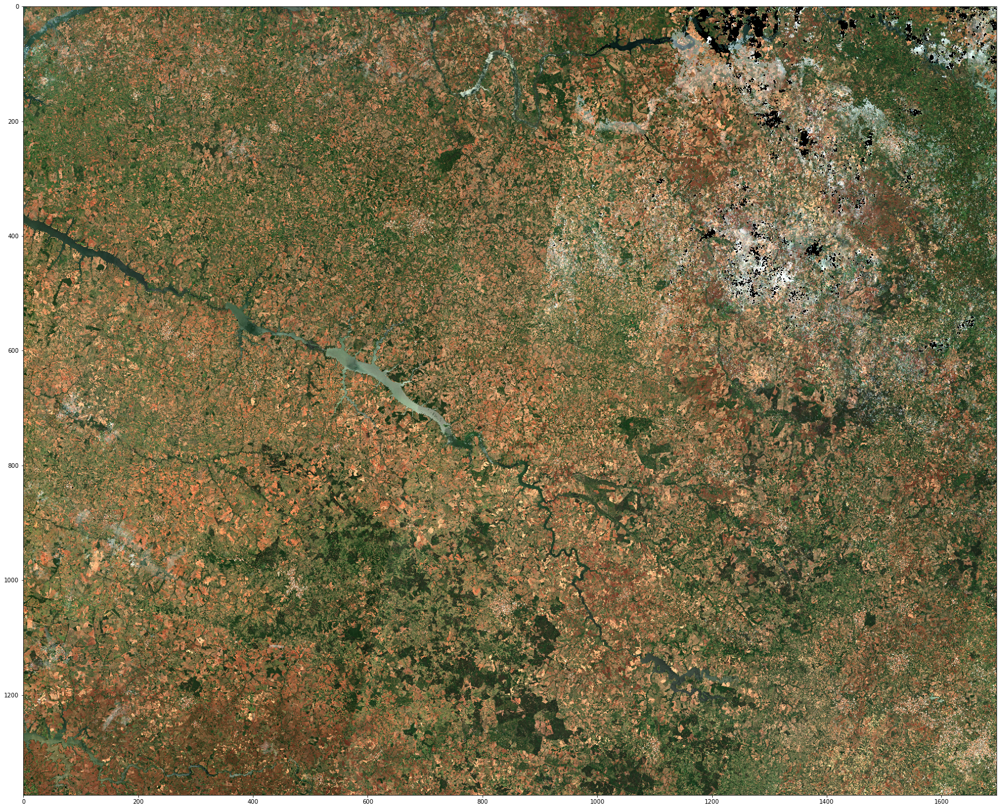

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError


In [161]:
plt.figure(figsize=(30, 30))
plt.imshow(median.to_numpy().transpose(1, 2, 0)/10000*4)

## Visualize the items

In [102]:
item = cube[0]
item.loc['B03']

<xarray.DataArray 'stackstac-ed68dac3f2cd143534cc6631313da3e6' (y: 348, x: 425)>
dask.array<getitem, shape=(348, 425), dtype=float64, chunksize=(348, 425), chunktype=numpy.ndarray>
Coordinates:
    time                                     datetime64[ns] 2021-08-02T13:22:...
    id                                       <U54 'S2A_MSIL2A_20210802T132241...
    band                                     <U3 'B03'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:reflectance_conversion_factor         float64 0.9703
    s2:saturated_defective_pixel_percentage  float64 0.0
    proj:epsg                                int64 32722
    s2:medium_proba_clouds_percentage        float64 1.138
    s2:granule_id                            <U62 'S2A_OPER_MSI_L2A_TL_ESRI_2...
    s2:dark_features_percentage              float64 1.499
    s2:datatake_id                           <U34 'GS2A_20210802T132241_03192...
    s2:processing_baseline                   <U5 '03.00'
    s2:nodata_pixel_percentage               float64 1e-05
    eo:cloud_cover                           float64 3.018
    s2:degraded_msi_data_percentage          float64 0.0
    s2:datastrip_id                          <U64 'S2A_OPER_MSI_L2A_DS_ESRI_2...
    s2:generation_time                       <U27 '2021-08-03T06:49:16.363110Z'
    s2:datatake_type                         <U8 'INS-NOBS'
    sat:orbit_state                          <U10 'descending'
    s2:unclassified_percentage               float64 5.246
    platform                                 <U11 'Sentinel-2A'
    s2:product_type                          <U7 'S2MSI2A'
    s2:cloud_shadow_percentage               float64 0.3521
    s2:not_vegetated_percentage              float64 46.57
    s2:vegetation_percentage                 float64 40.31
    instruments                              <U3 'msi'
    s2:mean_solar_zenith                     float64 48.97
    s2:snow_ice_percentage                   float64 0.0
    s2:high_proba_clouds_percentage          float64 0.3159
    constellation                            <U10 'Sentinel 2'
    s2:product_uri                           <U65 'S2A_MSIL2A_20210802T132241...
    sat:relative_orbit                       int64 38
    s2:mean_solar_azimuth                    float64 36.21
    s2:water_percentage                      float64 3.008
    s2:mgrs_tile                             <U5 '22KGV'
    s2:thin_cirrus_percentage                float64 1.564
    gsd                                      float64 10.0
    title                                    <U29 'Band 3 - Green - 10m'
    common_name                              object 'green'
    center_wavelength                        object 0.56
    full_width_half_max                      object 0.045
    epsg                                     int64 32723
Attributes:
    spec:        RasterSpec(epsg=32723, bounds=(-122500, 7443500, 90000, 7617...
    crs:         epsg:32723
    transform:   | 500.00, 0.00,-122500.00|\n| 0.00,-500.00, 7617500.00|\n| 0...
    resolution:  500

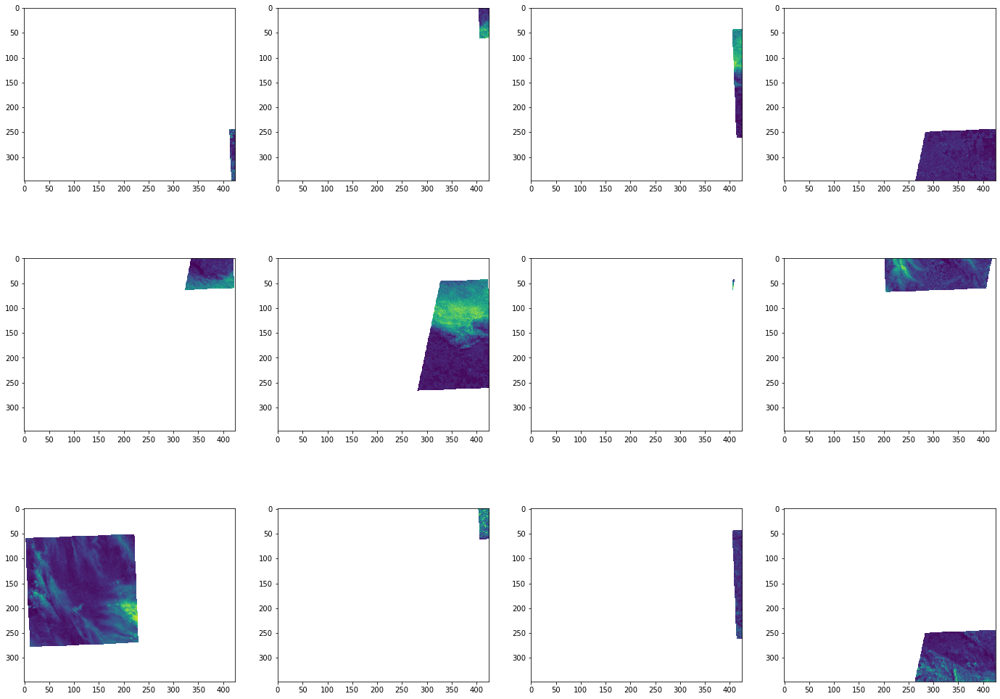

In [103]:
import matplotlib.pyplot as plt

cols = 4
rows = 3
size = 6
fig, ax = plt.subplots(rows, cols, figsize=(cols*size, rows*size))

for i in range(cols*rows):
    item = cube[i]
    
    ax.reshape(-1)[i].imshow(item.loc['B03'])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

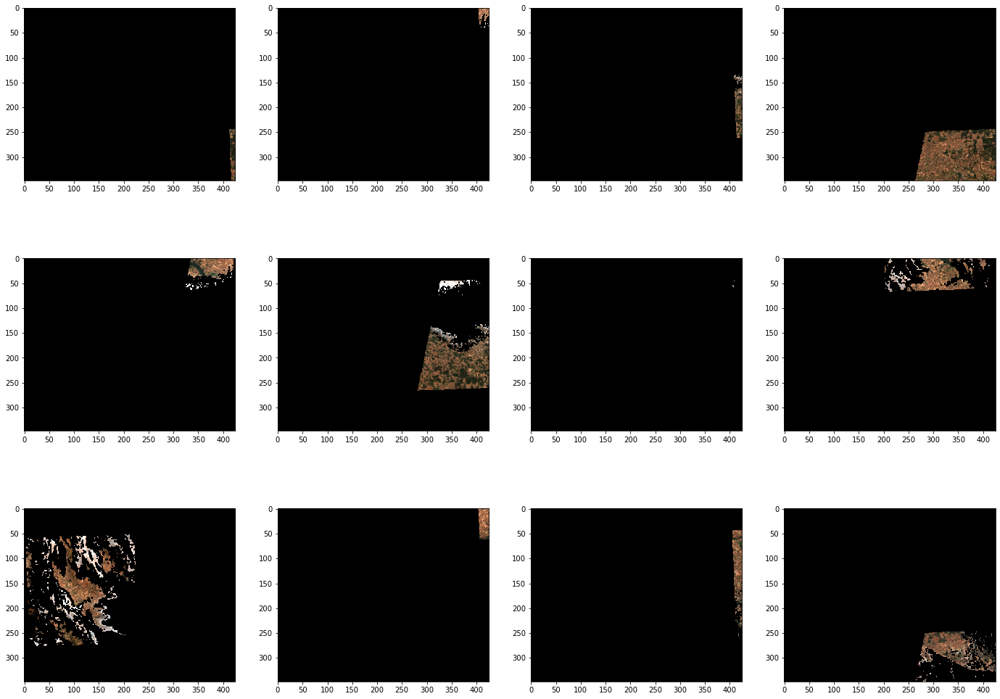

In [105]:
fig, ax = plt.subplots(rows, cols, figsize=(cols*size, rows*size))

for i in range(cols*rows):
    item = cube[i]
    scl = item.sel(band='SCL')
    
    mask = (scl >= 9) | (scl == 3) | (scl == 0)
    rgb = item.loc[['B04', 'B03', 'B02']].where(~mask)
    
    ax.reshape(-1)[i].imshow(rgb.to_numpy().transpose(1, 2, 0)/10000*4)
    

In [111]:
layers = []
for i in range(len(cube)):
    item = cube[i]
    scl = item.sel(band='SCL')
    mask = (scl >= 9) | (scl == 3) | (scl == 0)
    rgb = item.loc[['B04', 'B03', 'B02']].where(~mask)
    layers.append(rgb)

In [112]:
rgb_cube = xr.DataArray(layers, dims=['time', 'band', 'y', 'x'])

In [113]:
median = rgb_cube.median(dim='time')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


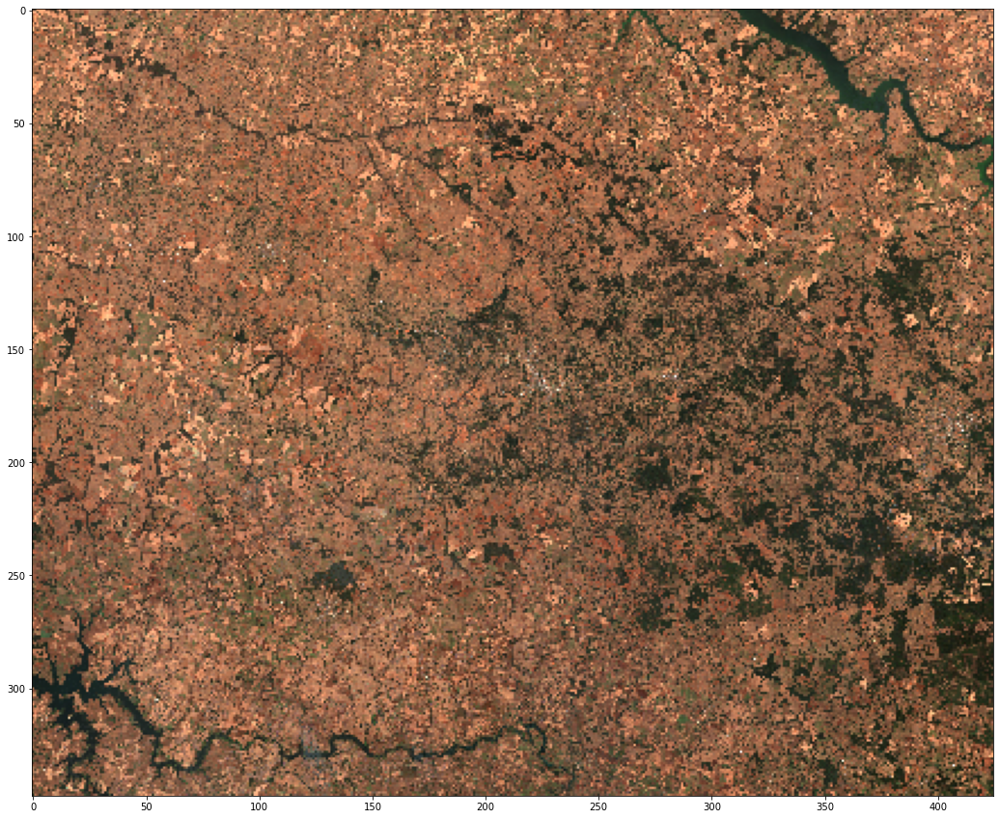

In [114]:
plt.figure(figsize=(20, 15))
plt.imshow(median.to_numpy().transpose(1, 2, 0)/10000*4)

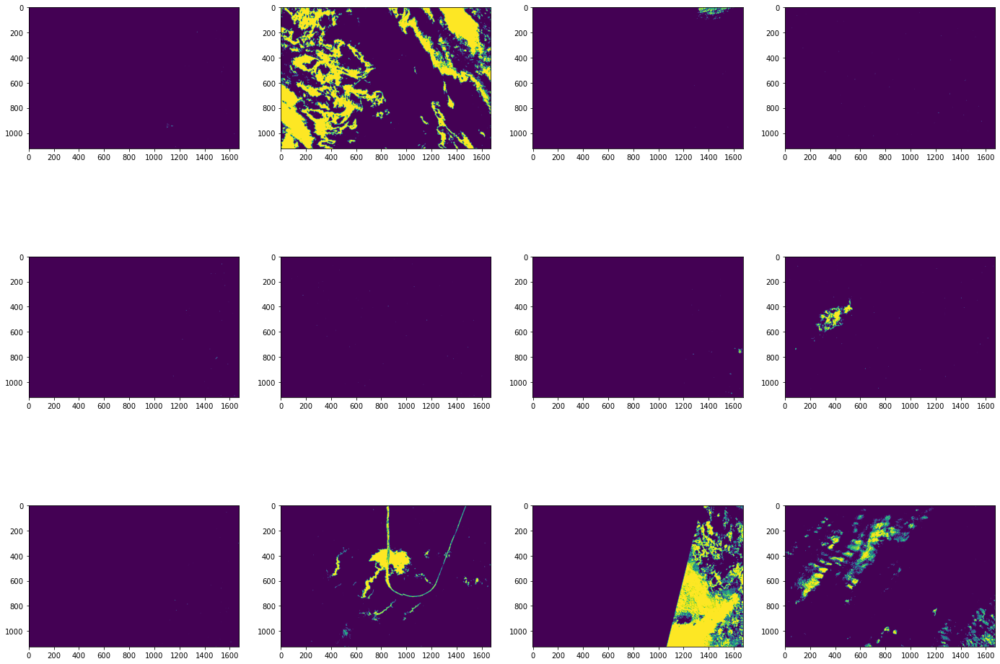

In [91]:
fig, ax = plt.subplots(rows, cols, figsize=(cols*size, rows*size))

for i in range(cols*rows):
    ax.reshape(-1)[i].imshow(mask[i])

In [116]:
# create a masked cube
masked_cube = cube.where(mask == False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

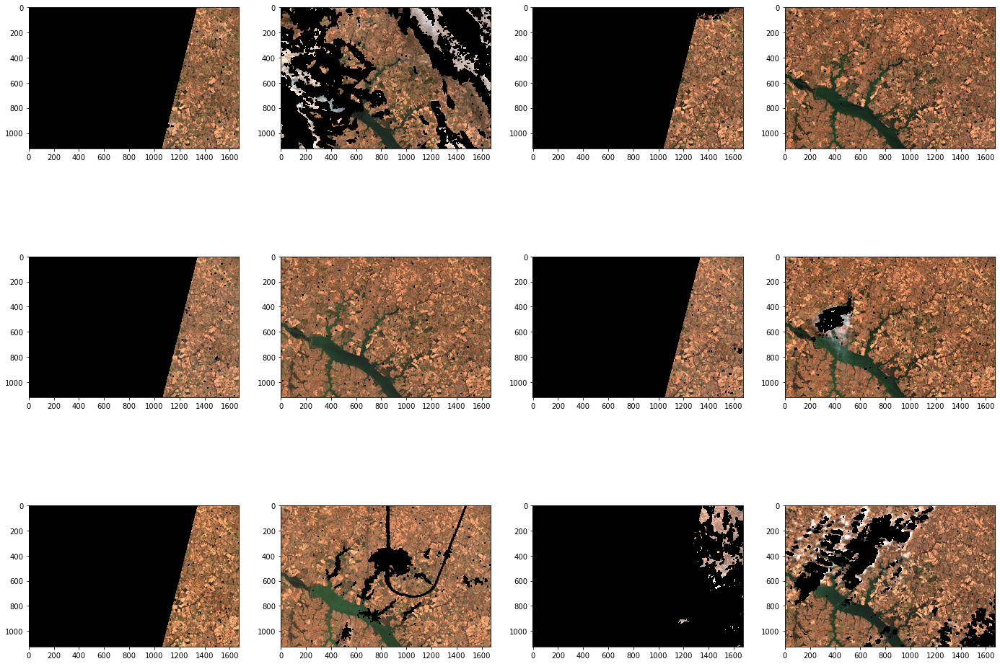

In [95]:
fig, ax = plt.subplots(rows, cols, figsize=(cols*size, rows*size))
for i in range(cols*rows):
    item = masked_cube[i]
    rgb = item.loc[['B04', 'B03', 'B02']]
    
    ax.reshape(-1)[i].imshow(rgb.to_numpy().transpose(1, 2, 0)/10000*4)
    
    layers.append(rgb)

In [123]:
median = masked_cube.median(dim='time').sel(band=['B04', 'B03', 'B02'])

plt.figure(figsize=(20, 15))
plt.imshow(median.to_numpy().transpose(1, 2, 0)/10000*4)

In [45]:
import xrspatial.multispectral as ms
from PIL import Image

In [10]:
# masked_cube = cube.groupby('time').where(cube.sel(band='SCL') > 5)
scl = cube.sel(band='SCL')

In [11]:
mask = (scl >= 9) | (scl == 3) | (scl == 0)

masked_cube = cube.groupby('time').where(mask == True)

In [12]:
median = masked_cube.median(dim='time')

In [13]:
rgb = median.sel(band=['B04', 'B03', 'B02'])

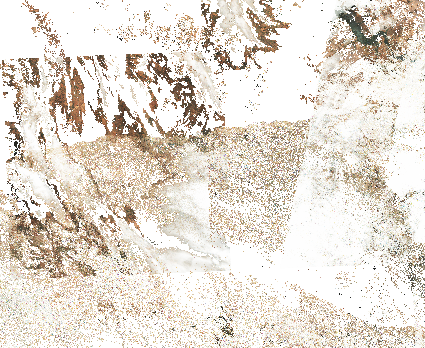

In [16]:
image = ms.true_color(*rgb, c=20, th=0.1)
Image.fromarray(image.to_numpy())

In [21]:
layers = []
for i in range(len(cube)):
    layer = cube[i]
    scl = layer.sel(band='SCL')
    mask = (scl >= 9) | (scl == 3) | (scl == 0)
    
    layers.append(layer.where(mask == True))

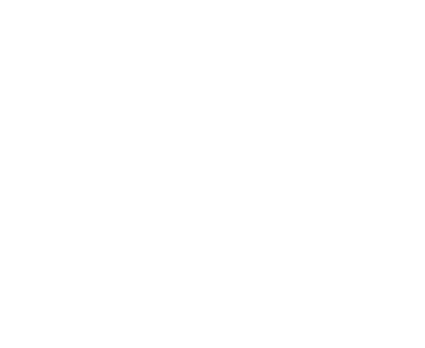

In [34]:
rgb = layers[60].sel(band=['B04', 'B03', 'B02'])
image = ms.true_color(*rgb, c=20, th=0.1)
Image.fromarray(image.to_numpy())

In [14]:
scl = cube.sel(band='SCL')
scl

<xarray.DataArray 'stackstac-38405ab391506741c64360e92c2db3b0' (time: 90, y: 348, x: 425)>
dask.array<getitem, shape=(90, 348, 425), dtype=float64, chunksize=(1, 348, 425), chunktype=numpy.ndarray>
Coordinates:
  * time                                     (time) datetime64[ns] 2021-08-02...
    id                                       (time) <U54 'S2A_MSIL2A_20210802...
    band                                     <U3 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:not_vegetated_percentage              (time) float64 46.57 ... 81.73
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 (time) <U11 'Sentinel-2A' ... 'S...
    s2:water_percentage                      (time) float64 3.008 ... 1.216
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       (time) <U27 '2021-08-03T06:49:16...
    s2:vegetation_percentage                 (time) float64 40.31 ... 16.79
    s2:degraded_msi_data_percentage          float64 0.0
    s2:unclassified_percentage               (time) float64 5.246 ... 0.07585
    s2:mean_solar_zenith                     (time) float64 48.97 ... 40.71
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    s2:thin_cirrus_percentage                (time) float64 1.564 ... 0.006186
    s2:medium_proba_clouds_percentage        (time) float64 1.138 ... 0.00217
    constellation                            <U10 'Sentinel 2'
    s2:dark_features_percentage              (time) float64 1.499 ... 0.1805
    s2:datastrip_id                          (time) <U64 'S2A_OPER_MSI_L2A_DS...
    s2:reflectance_conversion_factor         (time) float64 0.9703 ... 0.9798
    s2:high_proba_clouds_percentage          (time) float64 0.3159 ... 0.002881
    instruments                              <U3 'msi'
    s2:product_uri                           (time) <U65 'S2A_MSIL2A_20210802...
    eo:cloud_cover                           (time) float64 3.018 ... 0.01124
    s2:cloud_shadow_percentage               (time) float64 0.3521 ... 0.000126
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:datatake_id                           (time) <U34 'GS2A_20210802T13224...
    s2:snow_ice_percentage                   float64 0.0
    sat:relative_orbit                       (time) int64 38 38 38 ... 81 81 81
    s2:nodata_pixel_percentage               (time) float64 1e-05 ... 0.02817
    s2:granule_id                            (time) <U62 'S2A_OPER_MSI_L2A_TL...
    s2:mgrs_tile                             (time) <U5 '22KGV' ... '22KDA'
    sat:orbit_state                          <U10 'descending'
    s2:mean_solar_azimuth                    (time) float64 36.21 ... 43.33
    gsd                                      float64 20.0
    title                                    <U29 'Scene classfication map (S...
    common_name                              object None
    center_wavelength                        object None
    full_width_half_max                      object None
    epsg                                     int64 32723
Attributes:
    spec:        RasterSpec(epsg=32723, bounds=(-122500, 7443500, 90000, 7617...
    crs:         epsg:32723
    transform:   | 500.00, 0.00,-122500.00|\n| 0.00,-500.00, 7617500.00|\n| 0...
    resolution:  500

In [15]:
mask = (scl >= 9) | (scl == 3) | (scl == 0)
mask

<xarray.DataArray 'stackstac-38405ab391506741c64360e92c2db3b0' (time: 90, y: 348, x: 425)>
dask.array<or_, shape=(90, 348, 425), dtype=bool, chunksize=(1, 348, 425), chunktype=numpy.ndarray>
Coordinates:
  * time                                     (time) datetime64[ns] 2021-08-02...
    id                                       (time) <U54 'S2A_MSIL2A_20210802...
    band                                     <U3 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:not_vegetated_percentage              (time) float64 46.57 ... 81.73
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 (time) <U11 'Sentinel-2A' ... 'S...
    s2:water_percentage                      (time) float64 3.008 ... 1.216
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       (time) <U27 '2021-08-03T06:49:16...
    s2:vegetation_percentage                 (time) float64 40.31 ... 16.79
    s2:degraded_msi_data_percentage          float64 0.0
    s2:unclassified_percentage               (time) float64 5.246 ... 0.07585
    s2:mean_solar_zenith                     (time) float64 48.97 ... 40.71
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    s2:thin_cirrus_percentage                (time) float64 1.564 ... 0.006186
    s2:medium_proba_clouds_percentage        (time) float64 1.138 ... 0.00217
    constellation                            <U10 'Sentinel 2'
    s2:dark_features_percentage              (time) float64 1.499 ... 0.1805
    s2:datastrip_id                          (time) <U64 'S2A_OPER_MSI_L2A_DS...
    s2:reflectance_conversion_factor         (time) float64 0.9703 ... 0.9798
    s2:high_proba_clouds_percentage          (time) float64 0.3159 ... 0.002881
    instruments                              <U3 'msi'
    s2:product_uri                           (time) <U65 'S2A_MSIL2A_20210802...
    eo:cloud_cover                           (time) float64 3.018 ... 0.01124
    s2:cloud_shadow_percentage               (time) float64 0.3521 ... 0.000126
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:datatake_id                           (time) <U34 'GS2A_20210802T13224...
    s2:snow_ice_percentage                   float64 0.0
    sat:relative_orbit                       (time) int64 38 38 38 ... 81 81 81
    s2:nodata_pixel_percentage               (time) float64 1e-05 ... 0.02817
    s2:granule_id                            (time) <U62 'S2A_OPER_MSI_L2A_TL...
    s2:mgrs_tile                             (time) <U5 '22KGV' ... '22KDA'
    sat:orbit_state                          <U10 'descending'
    s2:mean_solar_azimuth                    (time) float64 36.21 ... 43.33
    gsd                                      float64 20.0
    title                                    <U29 'Scene classfication map (S...
    common_name                              object None
    center_wavelength                        object None
    full_width_half_max                      object None
    epsg                                     int64 32723

In [16]:
# mask the bands
for band in ['B04', 'B03', 'B02']:
    cube.sel(band=band).values[mask.values] = np.nan

In [17]:
median = cube.sel(band=['B04', 'B03', 'B02']).median(dim='time').compute()
median

<xarray.DataArray 'stackstac-38405ab391506741c64360e92c2db3b0' (band: 3, y: 348, x: 425)>
array([[[ 870.5,  968.5, 2668. , ..., 1890. , 1476. , 2499. ],
        [2630. , 2678. , 1138. , ..., 1569. , 1709. , 1530. ],
        [1603. , 2214. , 2500. , ..., 1759. , 2332. , 1842. ],
        ...,
        [ 788. , 1206. ,  941. , ...,  800.5,  366.5,  447. ],
        [1000. , 1270. , 1144. , ..., 1701. ,  446. ,  507.5],
        [ 287. , 2090. , 1230. , ...,  609. , 1029. ,  554. ]],

       [[ 641. ,  747. , 1717. , ..., 1319. ,  993. , 1617. ],
        [1766. , 1775. ,  864.5, ..., 1098. , 1201. , 1081. ],
        [1038. , 1292. , 1636. , ..., 1193. , 1519. , 1304. ],
        ...,
        [ 692. ,  824. ,  676. , ...,  760.5,  449. ,  485.5],
        [ 886. ,  766. ,  777. , ..., 1122. ,  544.5,  622. ],
        [ 433. , 1388. ,  809. , ...,  679.5,  725.5,  549.5]],

       [[ 490.5,  561. , 1206. , ..., 1012. ,  742.5, 1162. ],
        [1302. , 1331. ,  597. , ...,  805.5,  872.5,  818.5],
        [ 699.5,  917. , 1233. , ...,  877. , 1089. ,  984.5],
        ...,
        [ 460. ,  591. ,  478. , ...,  467. ,  266. ,  270.5],
        [ 583. ,  567. ,  561. , ...,  690. ,  326.5,  365.5],
        [ 246. , 1034. ,  585. , ...,  393. ,  444. ,  327. ]]])
Coordinates:
  * band                                     (band) <U3 'B04' 'B03' 'B02'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:product_type                          <U7 'S2MSI2A'
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:degraded_msi_data_percentage          float64 0.0
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    constellation                            <U10 'Sentinel 2'
    instruments                              <U3 'msi'
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:snow_ice_percentage                   float64 0.0
    sat:orbit_state                          <U10 'descending'
    gsd                                      (band) float64 10.0 10.0 10.0
    title                                    (band) <U29 'Band 4 - Red - 10m'...
    common_name                              (band) object 'red' 'green' 'blue'
    center_wavelength                        (band) object 0.665 0.56 0.49
    full_width_half_max                      (band) object 0.038 0.045 0.098
    epsg                                     int64 32723

In [23]:
mask_count = mask.sum(dim='time').compute()

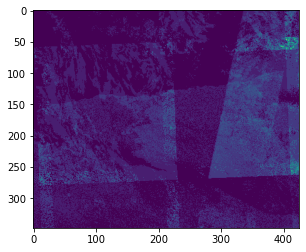

In [26]:
plt.imshow(mask_count)

In [28]:
median.size

443700

In [29]:
np.count_nonzero(np.isnan(median))

0

In [30]:
np.count_nonzero(mask)

125462

In [33]:
mask.time

<xarray.DataArray 'time' (time: 90)>
array(['2021-08-02T13:22:41.024000000', '2021-08-02T13:22:41.024000000',
       '2021-08-02T13:22:41.024000000', '2021-08-02T13:22:41.024000000',
       '2021-08-02T13:22:41.024000000', '2021-08-02T13:22:41.024000000',
       '2021-08-05T13:32:31.024000000', '2021-08-05T13:32:31.024000000',
       '2021-08-05T13:32:31.024000000', '2021-08-07T13:22:39.024000000',
       '2021-08-07T13:22:39.024000000', '2021-08-07T13:22:39.024000000',
       '2021-08-07T13:22:39.024000000', '2021-08-07T13:22:39.024000000',
       '2021-08-10T13:32:29.024000000', '2021-08-10T13:32:29.024000000',
       '2021-08-10T13:32:29.024000000', '2021-08-10T13:32:29.024000000',
       '2021-08-10T13:32:29.024000000', '2021-08-10T13:32:29.024000000',
       '2021-08-10T13:32:29.024000000', '2021-08-10T13:32:29.024000000',
       '2021-08-10T13:32:29.024000000', '2021-08-10T13:32:29.024000000',
       '2021-08-10T13:32:29.024000000', '2021-08-12T13:22:41.024000000',
       '2021-08-12T13:22:41.024000000', '2021-08-12T13:22:41.024000000',
       '2021-08-12T13:22:41.024000000', '2021-08-12T13:22:41.024000000',
       '2021-08-15T13:32:31.024000000', '2021-08-15T13:32:31.024000000',
       '2021-08-15T13:32:31.024000000', '2021-08-15T13:32:31.024000000',
       '2021-08-15T13:32:31.024000000', '2021-08-15T13:32:31.024000000',
       '2021-08-15T13:32:31.024000000', '2021-08-15T13:32:31.024000000',
       '2021-08-15T13:32:31.024000000', '2021-08-15T13:32:31.024000000',
       '2021-08-15T13:32:31.024000000', '2021-08-17T13:22:29.024000000',
       '2021-08-17T13:22:29.024000000', '2021-08-17T13:22:29.024000000',
       '2021-08-17T13:22:29.024000000', '2021-08-17T13:22:29.024000000',
       '2021-08-17T13:22:29.024000000', '2021-08-20T13:32:29.024000000',
       '2021-08-20T13:32:29.024000000', '2021-08-20T13:32:29.024000000',
       '2021-08-20T13:32:29.024000000', '2021-08-20T13:32:29.024000000',
       '2021-08-20T13:32:29.024000000', '2021-08-20T13:32:29.024000000',
       '2021-08-20T13:32:29.024000000', '2021-08-20T13:32:29.024000000',
       '2021-08-20T13:32:29.024000000', '2021-08-20T13:32:29.024000000',
       '2021-08-22T13:22:41.024000000', '2021-08-22T13:22:41.024000000',
       '2021-08-22T13:22:41.024000000', '2021-08-22T13:22:41.024000000',
       '2021-08-22T13:22:41.024000000', '2021-08-22T13:22:41.024000000',
       '2021-08-25T13:30:31.024000000', '2021-08-25T13:30:31.024000000',
       '2021-08-25T13:30:31.024000000', '2021-08-25T13:30:31.024000000',
       '2021-08-25T13:30:31.024000000', '2021-08-25T13:30:31.024000000',
       '2021-08-25T13:30:31.024000000', '2021-08-25T13:30:31.024000000',
       '2021-08-25T13:30:31.024000000', '2021-08-25T13:30:31.024000000',
       '2021-08-25T13:30:31.024000000', '2021-08-27T13:20:39.024000000',
       '2021-08-27T13:20:39.024000000', '2021-08-27T13:20:39.024000000',
       '2021-08-27T13:20:39.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time                                     (time) datetime64[ns] 2021-08-02...
    id                                       (time) <U54 'S2A_MSIL2A_20210802...
    band                                     <U3 'SCL'
    s2:not_vegetated_percentage              (time) float64 46.57 ... 81.73
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 (time) <U11 'Sentinel-2A' ... 'S...
    s2:water_percentage                      (time) float64 3.008 ... 1.216
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       (time) <U27 '2021-08-03

In [34]:
last_mask = mask.sel(time='2021-08-30T13:30:29.024000000')

In [35]:
red = cube.sel(time='2021-08-30T13:30:29.024000000', band='B04')

In [38]:
red.time

<xarray.DataArray 'time' (time: 11)>
array(['2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000', '2021-08-30T13:30:29.024000000',
       '2021-08-30T13:30:29.024000000'], dtype='datetime64[ns]')
Coordinates:
  * time                                     (time) datetime64[ns] 2021-08-30...
    id                                       (time) <U54 'S2B_MSIL2A_20210830...
    band                                     <U3 'B04'
    s2:not_vegetated_percentage              (time) float64 81.34 ... 81.73
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 (time) <U11 'Sentinel-2B' ... 'S...
    s2:water_percentage                      (time) float64 0.1186 ... 1.216
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       (time) <U27 '2021-08-30T21:52:41...
    s2:vegetation_percentage                 (time) float64 10.98 ... 16.79
    s2:degraded_msi_data_percentage          float64 0.0
    s2:unclassified_percentage               (time) float64 1.733 ... 0.07585
    s2:mean_solar_zenith                     (time) float64 38.29 ... 40.71
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    s2:thin_cirrus_percentage                (time) float64 2.054 ... 0.006186
    s2:medium_proba_clouds_percentage        (time) float64 0.9627 ... 0.00217
    constellation                            <U10 'Sentinel 2'
    s2:dark_features_percentage              (time) float64 0.9712 ... 0.1805
    s2:datastrip_id                          (time) <U64 'S2B_OPER_MSI_L2A_DS...
    s2:reflectance_conversion_factor         (time) float64 0.9798 ... 0.9798
    s2:high_proba_clouds_percentage          (time) float64 1.76 ... 0.002881
    instruments                              <U3 'msi'
    s2:product_uri                           (time) <U65 'S2B_MSIL2A_20210830...
    eo:cloud_cover                           (time) float64 4.777 ... 0.01124
    s2:cloud_shadow_percentage               (time) float64 0.08566 ... 0.000126
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:datatake_id                           (time) <U34 'GS2B_20210830T13302...
    s2:snow_ice_percentage                   float64 0.0
    sat:relative_orbit                       (time) int64 81 81 81 ... 81 81 81
    s2:nodata_pixel_percentage               (time) float64 86.11 ... 0.02817
    s2:granule_id                            (time) <U62 'S2B_OPER_MSI_L2A_TL...
    s2:mgrs_tile                             (time) <U5 '22KGB' ... '22KDA'
    sat:orbit_state                          <U10 'descending'
    s2:mean_solar_azimuth                    (time) float64 40.7 39.87 ... 43.33
    gsd                                      float64 10.0
    title                                    <U29 'Band 4 - Red - 10m'
    common_name                              object 'red'
    center_wavelength                        object 0.665
    full_width_half_max                      object 0.038
    epsg                                     int64 32723

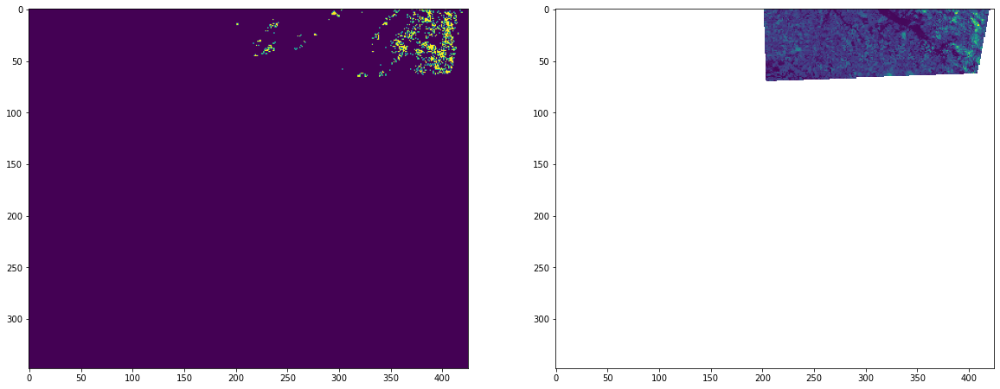

In [113]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
first_red = red[3]
ax[0].imshow(last_mask[3])
ax[1].imshow(first_red)

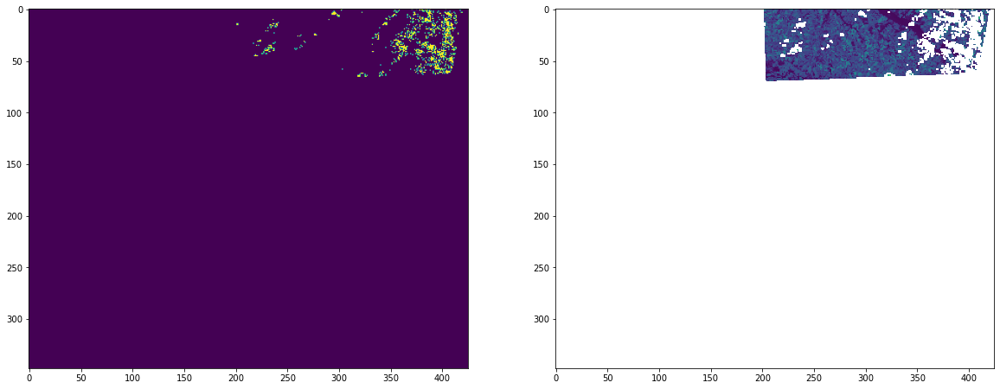

In [109]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
first_red = first_red.compute()
first_red.values[last_mask[3].values] = np.nan
ax[0].imshow(last_mask[3])
ax[1].imshow(first_red)

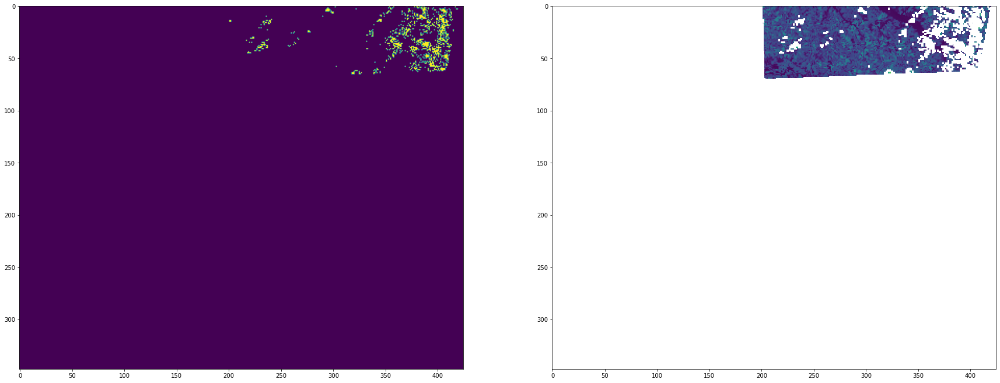

In [97]:
fig, ax = plt.subplots(1, 2, figsize=(30, 15))
first_red = first_red.to_numpy()
first_red[last_mask[3].values] = np.nan
ax[0].imshow(last_mask[3])
ax[1].imshow(first_red)

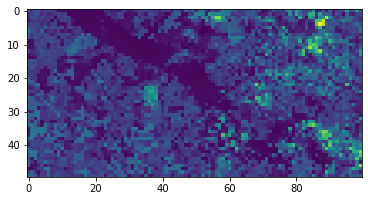

In [114]:
plt.imshow(first_red[:50, 300:400])

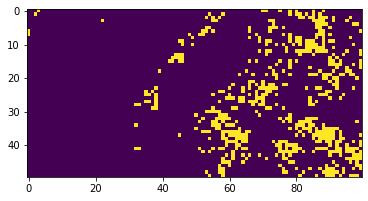

In [115]:
plt.imshow(last_mask[3].values[:50, 300:400])

In [127]:
date = cube[5]
date

<xarray.DataArray 'stackstac-38405ab391506741c64360e92c2db3b0' (band: 4, y: 348, x: 425)>
dask.array<getitem, shape=(4, 348, 425), dtype=float64, chunksize=(1, 348, 425), chunktype=numpy.ndarray>
Coordinates:
    time                                     datetime64[ns] 2021-08-02T13:22:...
    id                                       <U54 'S2A_MSIL2A_20210802T132241...
  * band                                     (band) <U3 'B04' 'B03' 'B02' 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:not_vegetated_percentage              float64 27.51
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 <U11 'Sentinel-2A'
    s2:water_percentage                      float64 0.06495
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       <U27 '2021-08-03T08:35:21.715308Z'
    s2:vegetation_percentage                 float64 25.23
    s2:degraded_msi_data_percentage          float64 0.0
    s2:unclassified_percentage               float64 6.613
    s2:mean_solar_zenith                     float64 48.83
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    s2:thin_cirrus_percentage                float64 1.166
    s2:medium_proba_clouds_percentage        float64 6.78
    constellation                            <U10 'Sentinel 2'
    s2:dark_features_percentage              float64 0.6837
    s2:datastrip_id                          <U64 'S2A_OPER_MSI_L2A_DS_ESRI_2...
    s2:reflectance_conversion_factor         float64 0.9703
    s2:high_proba_clouds_percentage          float64 31.68
    instruments                              <U3 'msi'
    s2:product_uri                           <U65 'S2A_MSIL2A_20210802T132241...
    eo:cloud_cover                           float64 39.62
    s2:cloud_shadow_percentage               float64 0.2733
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:datatake_id                           <U34 'GS2A_20210802T132241_03192...
    s2:snow_ice_percentage                   float64 0.0
    sat:relative_orbit                       int64 38
    s2:nodata_pixel_percentage               float64 43.17
    s2:granule_id                            <U62 'S2A_OPER_MSI_L2A_TL_ESRI_2...
    s2:mgrs_tile                             <U5 '22KFA'
    sat:orbit_state                          <U10 'descending'
    s2:mean_solar_azimuth                    float64 37.74
    gsd                                      (band) float64 10.0 10.0 10.0 20.0
    title                                    (band) <U29 'Band 4 - Red - 10m'...
    common_name                              (band) object 'red' ... None
    center_wavelength                        (band) object 0.665 0.56 0.49 None
    full_width_half_max                      (band) object 0.038 0.045 ... None
    epsg                                     int64 32723
Attributes:
    spec:        RasterSpec(epsg=32723, bounds=(-122500, 7443500, 90000, 7617...
    crs:         epsg:32723
    transform:   | 500.00, 0.00,-122500.00|\n| 0.00,-500.00, 7617500.00|\n| 0...
    resolution:  500

In [143]:
scl = date.sel(band='SCL')

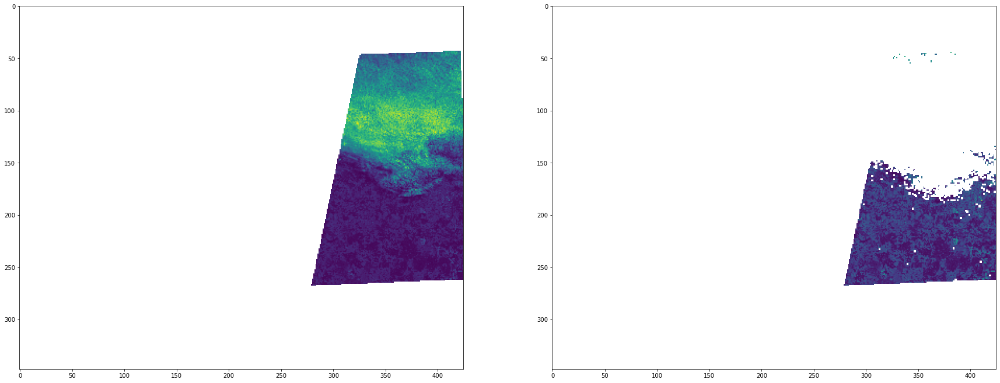

In [144]:
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

ax[0].imshow(date.sel(band='B03'))
ax[1].imshow(date.sel(band='B03').where(scl <= 5))

In [133]:
date['SCL']

KeyError: 'SCL'

In [131]:
date

<xarray.DataArray 'stackstac-38405ab391506741c64360e92c2db3b0' (band: 4, y: 348, x: 425)>
dask.array<getitem, shape=(4, 348, 425), dtype=float64, chunksize=(1, 348, 425), chunktype=numpy.ndarray>
Coordinates:
    time                                     datetime64[ns] 2021-08-02T13:22:...
    id                                       <U54 'S2A_MSIL2A_20210802T132241...
  * band                                     (band) <U3 'B04' 'B03' 'B02' 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:not_vegetated_percentage              float64 27.51
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 <U11 'Sentinel-2A'
    s2:water_percentage                      float64 0.06495
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       <U27 '2021-08-03T08:35:21.715308Z'
    s2:vegetation_percentage                 float64 25.23
    s2:degraded_msi_data_percentage          float64 0.0
    s2:unclassified_percentage               float64 6.613
    s2:mean_solar_zenith                     float64 48.83
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    s2:thin_cirrus_percentage                float64 1.166
    s2:medium_proba_clouds_percentage        float64 6.78
    constellation                            <U10 'Sentinel 2'
    s2:dark_features_percentage              float64 0.6837
    s2:datastrip_id                          <U64 'S2A_OPER_MSI_L2A_DS_ESRI_2...
    s2:reflectance_conversion_factor         float64 0.9703
    s2:high_proba_clouds_percentage          float64 31.68
    instruments                              <U3 'msi'
    s2:product_uri                           <U65 'S2A_MSIL2A_20210802T132241...
    eo:cloud_cover                           float64 39.62
    s2:cloud_shadow_percentage               float64 0.2733
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:datatake_id                           <U34 'GS2A_20210802T132241_03192...
    s2:snow_ice_percentage                   float64 0.0
    sat:relative_orbit                       int64 38
    s2:nodata_pixel_percentage               float64 43.17
    s2:granule_id                            <U62 'S2A_OPER_MSI_L2A_TL_ESRI_2...
    s2:mgrs_tile                             <U5 '22KFA'
    sat:orbit_state                          <U10 'descending'
    s2:mean_solar_azimuth                    float64 37.74
    gsd                                      (band) float64 10.0 10.0 10.0 20.0
    title                                    (band) <U29 'Band 4 - Red - 10m'...
    common_name                              (band) object 'red' ... None
    center_wavelength                        (band) object 0.665 0.56 0.49 None
    full_width_half_max                      (band) object 0.038 0.045 ... None
    epsg                                     int64 32723
Attributes:
    spec:        RasterSpec(epsg=32723, bounds=(-122500, 7443500, 90000, 7617...
    crs:         epsg:32723
    transform:   | 500.00, 0.00,-122500.00|\n| 0.00,-500.00, 7617500.00|\n| 0...
    resolution:  500

In [110]:
slice_red = first_red[:50, 300:400]
slice_mask = last_mask[3].values[:50, 300:400]

In [93]:
slice_red[slice_mask] = np.nan

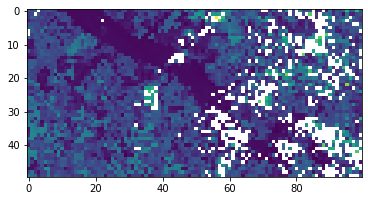

In [111]:
plt.imshow(slice_red)

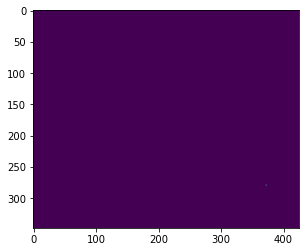

In [90]:
plt.imshow(mask[3])

In [73]:
first_red.where(mask[3], other=np.nan).values

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [43]:
last_mask[-1]

<xarray.DataArray 'stackstac-38405ab391506741c64360e92c2db3b0' (y: 348, x: 425)>
dask.array<getitem, shape=(348, 425), dtype=bool, chunksize=(348, 425), chunktype=numpy.ndarray>
Coordinates:
    time                                     datetime64[ns] 2021-08-30T13:30:...
    id                                       <U54 'S2B_MSIL2A_20210830T133029...
    band                                     <U3 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:not_vegetated_percentage              float64 81.73
    s2:product_type                          <U7 'S2MSI2A'
    platform                                 <U11 'Sentinel-2B'
    s2:water_percentage                      float64 1.216
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:generation_time                       <U27 '2021-08-30T21:21:07.27Z'
    s2:vegetation_percentage                 float64 16.79
    s2:degraded_msi_data_percentage          float64 0.0
    s2:unclassified_percentage               float64 0.07585
    s2:mean_solar_zenith                     float64 40.71
    proj:epsg                                int64 32722
    s2:processing_baseline                   <U5 '03.00'
    s2:thin_cirrus_percentage                float64 0.006186
    s2:medium_proba_clouds_percentage        float64 0.00217
    constellation                            <U10 'Sentinel 2'
    s2:dark_features_percentage              float64 0.1805
    s2:datastrip_id                          <U64 'S2B_OPER_MSI_L2A_DS_ESRI_2...
    s2:reflectance_conversion_factor         float64 0.9798
    s2:high_proba_clouds_percentage          float64 0.002881
    instruments                              <U3 'msi'
    s2:product_uri                           <U65 'S2B_MSIL2A_20210830T133029...
    eo:cloud_cover                           float64 0.01124
    s2:cloud_shadow_percentage               float64 0.000126
    s2:datatake_type                         <U8 'INS-NOBS'
    s2:datatake_id                           <U34 'GS2B_20210830T133029_02341...
    s2:snow_ice_percentage                   float64 0.0
    sat:relative_orbit                       int64 81
    s2:nodata_pixel_percentage               float64 0.02817
    s2:granule_id                            <U62 'S2B_OPER_MSI_L2A_TL_ESRI_2...
    s2:mgrs_tile                             <U5 '22KDA'
    sat:orbit_state                          <U10 'descending'
    s2:mean_solar_azimuth                    float64 43.33
    gsd                                      float64 20.0
    title                                    <U29 'Scene classfication map (S...
    common_name                              object None
    center_wavelength                        object None
    full_width_half_max                      object None
    epsg                                     int64 32723

In [25]:
import xrspatial.multispectral as ms
from PIL import Image
import matplotlib.pyplot as plt

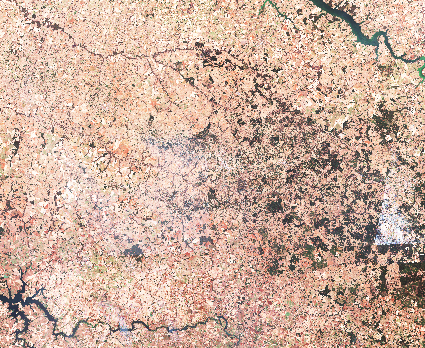

In [20]:
Image.fromarray(ms.true_color(*median, c=20, th=0.1).to_numpy())

In [ ]:
median = cube.sel(band=['B04', 'B03', 'B02']).median(dim='time').compute()
median

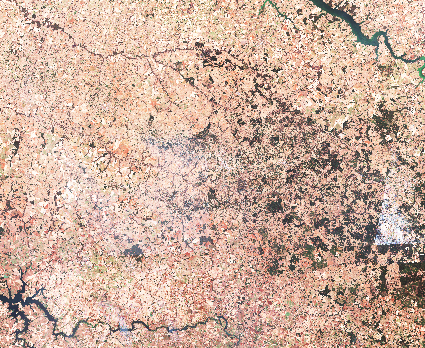

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError
Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/srv/conda/envs/notebook/lib/python3.8/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1131)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/asyncio/events.py", line 81, in _run
    self._context.run(self._callback, *self._args)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 1

In [85]:
Image.fromarray(ms.true_color(*median, c=20, th=0.1).to_numpy())

In [56]:
cube.sel(band='B04').values[mask.values] = np.nan

AttributeError: module 'numpy' has no attribute 'count_nonzeros'

In [43]:
median = cube.median(dim="time")
median

<xarray.DataArray 'stackstac-1aac42f4f450ea4aa08618b40425ce3d' (band: 4, y: 348, x: 425)>
dask.array<nanmedian, shape=(4, 348, 425), dtype=float64, chunksize=(1, 348, 425), chunktype=numpy.ndarray>
Coordinates:
  * band                                     (band) <U3 'B04' 'B03' 'B02' 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:product_type                          <U7 'S2MSI2A'
    sat:orbit_state                          <U10 'descending'
    s2:snow_ice_percentage                   float64 0.0
    s2:saturated_defective_pixel_percentage  float64 0.0
    proj:epsg                                int64 32722
    s2:datatake_type                         <U8 'INS-NOBS'
    constellation                            <U10 'Sentinel 2'
    s2:degraded_msi_data_percentage          float64 0.0
    instruments                              <U3 'msi'
    gsd                                      (band) float64 10.0 10.0 10.0 20.0
    title                                    (band) <U29 'Band 4 - Red - 10m'...
    common_name                              (band) object 'red' ... None
    center_wavelength                        (band) object 0.665 0.56 0.49 None
    full_width_half_max                      (band) object 0.038 0.045 ... None
    epsg                                     int64 32723

In [45]:
median

<xarray.DataArray 'stackstac-1aac42f4f450ea4aa08618b40425ce3d' (band: 4, y: 348, x: 425)>
dask.array<nanmedian, shape=(4, 348, 425), dtype=float64, chunksize=(1, 348, 425), chunktype=numpy.ndarray>
Coordinates:
  * band                                     (band) <U3 'B04' 'B03' 'B02' 'SCL'
  * x                                        (x) float64 -1.225e+05 ... 8.95e+04
  * y                                        (y) float64 7.618e+06 ... 7.444e+06
    s2:product_type                          <U7 'S2MSI2A'
    sat:orbit_state                          <U10 'descending'
    s2:snow_ice_percentage                   float64 0.0
    s2:saturated_defective_pixel_percentage  float64 0.0
    proj:epsg                                int64 32722
    s2:datatake_type                         <U8 'INS-NOBS'
    constellation                            <U10 'Sentinel 2'
    s2:degraded_msi_data_percentage          float64 0.0
    instruments                              <U3 'msi'
    gsd                                      (band) float64 10.0 10.0 10.0 20.0
    title                                    (band) <U29 'Band 4 - Red - 10m'...
    common_name                              (band) object 'red' ... None
    center_wavelength                        (band) object 0.665 0.56 0.49 None
    full_width_half_max                      (band) object 0.038 0.045 ... None
    epsg                                     int64 32723

## Visualizing

In [29]:
import xrspatial.multispectral as ms
from PIL import Image

In [31]:
image = ms.true_color(*median, c=20, th=0.1)

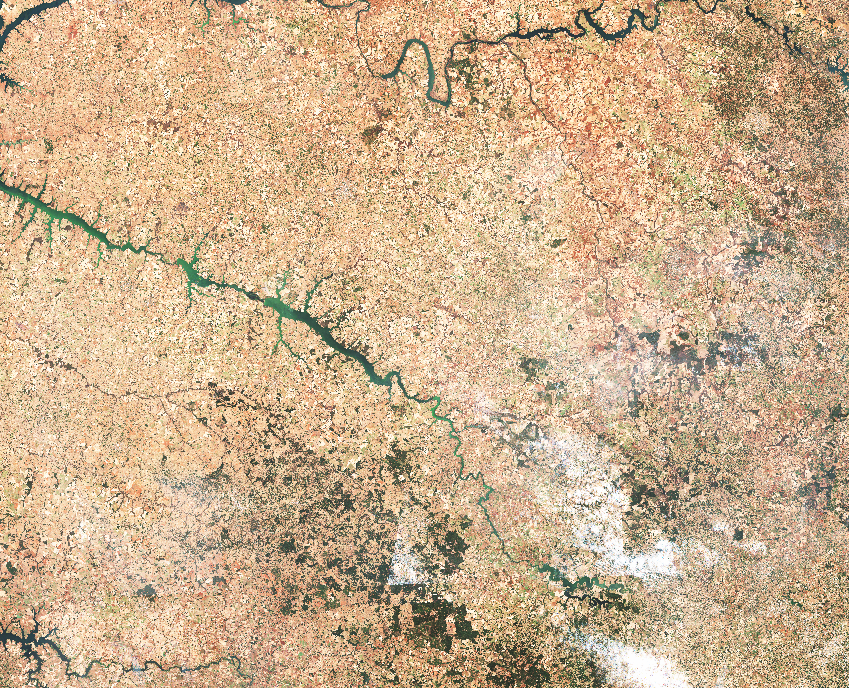

In [32]:
Image.fromarray(image.to_numpy())

In [23]:
rgb = cube.compute()

In [27]:
median = cube.median(dim="time").compute()

In [28]:
median

<xarray.DataArray 'stackstac-5816e4d2104263559bcfe6c1d8f2dc27' (band: 3, y: 688, x: 849)>
array([[[ 243.5,  223.5,  243.5, ..., 1498. ,  733. ,  550. ],
        [ 251. ,  235. ,  207. , ...,  910.5,  874.5,  926. ],
        [ 255. ,  223.5,  218.5, ...,  555. , 1602. , 1636. ],
        ...,
        [ 804. , 1094. ,  957. , ...,  410.5, 1054. , 1174. ],
        [ 797. ,  504. ,  478. , ..., 1505. ,  514.5, 2656. ],
        [ 916. ,  885. , 1232. , ..., 1271. ,  312.5,  388. ]],

       [[ 433. ,  399. ,  405. , ..., 1101. ,  663.5,  439.5],
        [ 434. ,  408.5,  397. , ...,  671.5,  617.5,  636. ],
        [ 424.5,  409.5,  334. , ...,  468. , 1078. , 1137. ],
        ...,
        [ 598. ,  622. ,  611. , ...,  516.5,  830.5,  901. ],
        [ 626. ,  583. ,  559. , ..., 1279. ,  510. , 2234. ],
        [ 600. ,  650. ,  971. , ..., 1114. ,  454.5,  416. ]],

       [[ 381.5,  377.5,  393. , ...,  764. ,  465.5,  300. ],
        [ 393.5,  383. ,  379.5, ...,  529.5,  470.5,  481.5],
        [ 399.5,  367.5,  336.5, ...,  361.5,  772. ,  779.5],
        ...,
        [ 424. ,  491. ,  423. , ...,  358. ,  552.5,  599. ],
        [ 450. ,  398. ,  361. , ...,  857. ,  347. , 1820. ],
        [ 416. ,  438. ,  695. , ...,  950. ,  262. ,  309. ]]])
Coordinates:
  * band                                     (band) <U3 'B04' 'B03' 'B02'
  * x                                        (x) float64 -1.29e+05 ... 2.95e+05
  * y                                        (y) float64 7.788e+06 ... 7.444e+06
    s2:product_type                          <U7 'S2MSI2A'
    sat:orbit_state                          <U10 'descending'
    s2:snow_ice_percentage                   float64 0.0
    s2:saturated_defective_pixel_percentage  float64 0.0
    s2:datatake_type                         <U8 'INS-NOBS'
    constellation                            <U10 'Sentinel 2'
    s2:processing_baseline                   <U5 '03.00'
    s2:degraded_msi_data_percentage          float64 0.0
    instruments                              <U3 'msi'
    gsd                                      int64 10
    title                                    (band) <U20 'Band 4 - Red - 10m'...
    proj:shape                               object {10980}
    common_name                              (band) <U5 'red' 'green' 'blue'
    center_wavelength                        (band) float64 0.665 0.56 0.49
    full_width_half_max                      (band) float64 0.038 0.045 0.098
    epsg                                     int64 32723

In [29]:
# from pystac_client import Client, ItemSearch
# import planetary_computer as pc
# import rasterio as rio
# import rioxarray as xrio
# import xarray as xr
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np
# from joblib import Parallel, delayed

# from ms_waterdetect import open_image, search_img, bands_to_columns, find_best_k, clusterize, calc_clusters_params, itendify_water_cluster, \
#                         WaterDetect, calc_normalized_difference, generalize, search_tiles

# Getting the Image to be Processed

In [30]:
# from dask_gateway import GatewayCluster
# cluster = GatewayCluster()  # Creates the Dask Scheduler. Might take a minute.

# client = cluster.get_client()

# cluster.adapt(minimum=4, maximum=24)
# print(cluster.dashboard_link)

In [31]:
#initial parameters

# coordinates of the image in (long, lat)
# coords = (-49.5, -23) # Paranapanema "2020-12-18
coords = (1.43, 43.6)


In [32]:
# get the images... if more than 1 image is located, get the first
# imgs = search_img(coords=coords, date="2021-08-18/2021-08-25")
# img_item = imgs[0]
# img_item

In [33]:
tile = search_tiles('30TXQ', '2018-09-11')[0]

# Create WD Instance

In [34]:
cluster_bands = ['mndwi', 'ndwi', 'B12']
%time wd = WaterDetect(tile, cluster_bands, n_jobs=4)
wd

resampling B11 to (10980, 10980)
resampling B12 to (10980, 10980)
resampling SCL to (10980, 10980)
Calculating indices
CPU times: user 11.4 s, sys: 7.6 s, total: 19 s
Wall time: 48.9 s


*** WaterDetect class *** 
Img loaded with following bands: Data variables:
    B02      (y, x) float32 0.0153 0.0137 0.0133 0.0143 ... 0.0082 0.0095 0.0076
    B03      (y, x) float32 0.0094 0.0087 0.008 0.0078 ... 0.0248 0.0259 0.0252
    B04      (y, x) float32 0.0028 0.0021 0.0021 0.0021 ... 0.0176 0.0151 0.0135
    B11      (y, x) float32 0.0013 0.0013 0.0011 0.0011 ... 0.111 0.1136 0.1136
    B12      (y, x) float32 0.0014 0.0014 0.0004 0.0004 ... 0.0496 0.0486 0.0486
    B08      (y, x) float32 0.001 0.0005 0.0023 0.0005 ... 0.2166 0.2086 0.2208
    SCL      (y, x) uint8 6 6 6 6 6 6 6 6 6 6 6 6 6 ... 4 4 4 4 4 4 4 4 4 4 4 4
    mndwi    (y, x) float16 0.7402 0.7227 0.9053 ... -0.3333 -0.3049 -0.3169
    ndwi     (y, x) float16 0.8076 0.8906 0.5537 ... -0.7944 -0.7793 -0.7944
    mbwi     (y, x) float16 1.252e-06 1.192e-06 ... -3.344e-05 -3.463e-05
    mask     (y, x) bool False False False False ... False False False False
Water mask not processed. Call .run_detect_water() metho

In [35]:
# fig = wd.plot_thumbs(cols=3, bands=['rgb', 'mask', 'mndwi', 'ndwi', 'mbwi', 'SCL'])

# Detect Water

In [36]:
%time wd.run_detect_water()

k=2 - Calinski=67650.69556272222
k=3 - Calinski=36280.10944309293
k=4 - Calinski=25891.67436324501
k=5 - Calinski=20240.655860064944
k=6 - Calinski=31164.114474646813
k=7 - Calinski=26002.578650972777
Final clustering with k=2
Water cluster = 1
Generalized for the whole scene
Finalized. Access .water_mask or .cluster_matrix for final result
CPU times: user 27.6 s, sys: 10.7 s, total: 38.3 s
Wall time: 45.9 s


In [37]:
wd.cluster_params.loc['mean']

,B02,B03,B04,B11,B12,B08,SCL,mndwi,ndwi,mbwi,mask
0,0.108889,0.201348,0.195061,0.699490,0.420136,0.937528,4.141770,-0.313074,-0.653076,-0.000046,0.0
1,0.077445,0.065147,0.036042,0.010419,0.009628,0.022712,6.003402,0.715998,0.665204,0.000001,0.0


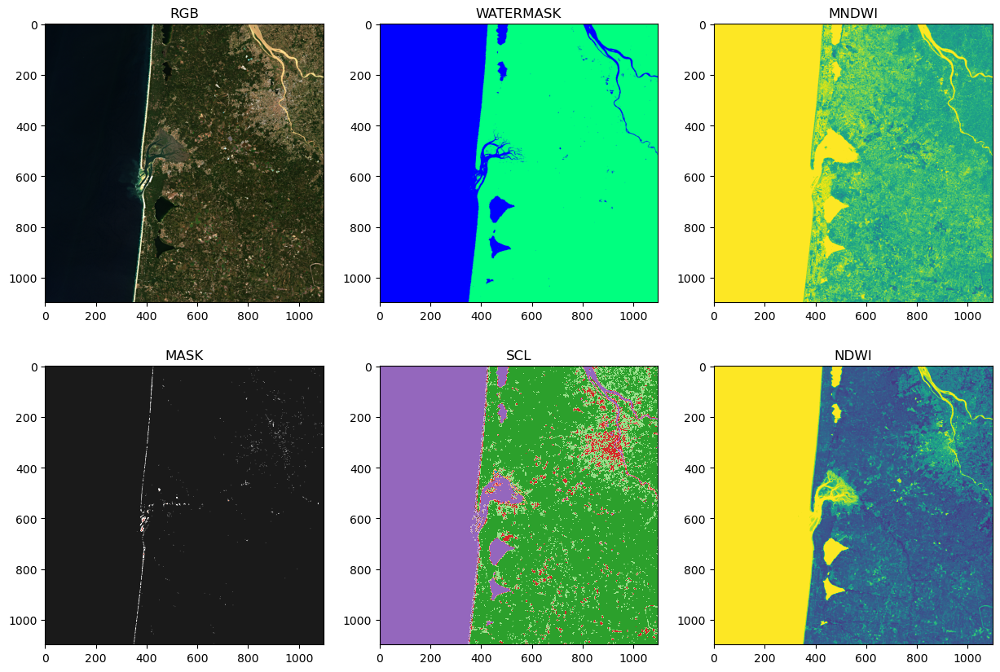

In [40]:
wd.plot_thumbs(cols=3, bands=['rgb', 'watermask', 'mndwi', 'mask', 'SCL', 'ndwi'], save=True)

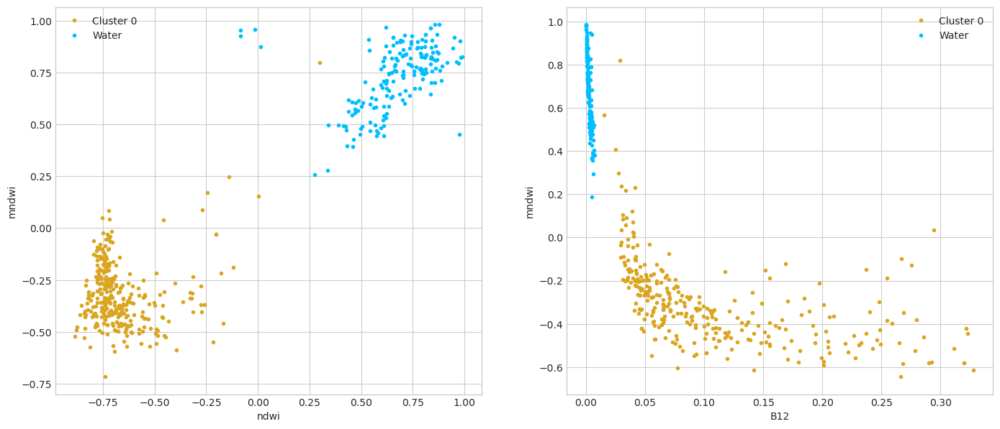

In [43]:
wd.plot_graphs([['ndwi', 'mndwi'], ['B12', 'mndwi']], cols=2, save=True)

# Automating 

In [ ]:
wd.plot_graphs([''])